In [283]:
import argparse
import os
import copy

import numpy as np
import torch
from PIL import Image, ImageDraw, ImageFont
from torchvision.ops import box_convert
import supervision as sv
from segment_anything import build_sam, SamPredictor 
import cv2
import numpy as np
import matplotlib.pyplot as plt
import PIL
import requests
import torch
from io import BytesIO
from diffusers import StableDiffusionInpaintPipeline
import json

from huggingface_hub import hf_hub_download
import supervision as sv
from pycocotools import mask as maskUtils

In [3]:
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

sam_checkpoint = '/home/datadisk/evaluation/models/SAM/sam_vit_h_4b8939.pth'
sam = build_sam(checkpoint=sam_checkpoint)
sam.to(device=DEVICE)
sam_predictor = SamPredictor(sam)

In [351]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    return mask_image
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))  


def polygon_to_mask(polygon, image_height, image_width):
    # Create an empty mask
    mask = np.zeros((image_height, image_width), dtype=np.uint8)
    
    # Create a COCO-style RLE (Run-Length Encoding) mask from polygon
    rle = maskUtils.frPyObjects(polygon, image_height, image_width)
    
    # Decode the RLE mask to binary mask
    mask = maskUtils.decode(rle)
    
    return mask

def dice_coefficient(mask1, mask2):
    mask1 = mask1>0
    mask2 = mask2>0
    
    # Ensure masks are binary and have the same shape
    mask1 = np.asarray(mask1, dtype=np.bool_)
    mask2 = np.asarray(mask2, dtype=np.bool_)

    intersection = np.logical_and(mask1, mask2).sum()
    
    union = np.logical_or(mask1, mask2).sum()
    
    # Compute Dice coefficient
    dice = 2. * intersection / (intersection+union)  # Handle case where union is 0
    return dice



In [57]:
file_path = '/home/datadisk/evaluation/data/Seg/iSAID/iSAID_val_20190823_114742_2.json'
# Load the JSON file
with open(file_path, 'r') as f:
    json_data = json.load(f)

# Split the data into 20% and 80%
data = json_data['data']

In [352]:
index = 0
image_path = data[index]['image'][0]
print (image_path)
annotations = data[index]['annotations']

box_list = []
label_list = []
segmentation_poly = []
for annotation in annotations:
    box_list.append(annotation['bbox'])
    label_list.append(annotation['label'])
    segmentation_poly.append(annotation['segmentation'])
# for i, (x, y, w, h) in enumerate(box_list):
#     print ((x, y, w, h))

#print (annotations)
len(box_list)

DOTA_v1.0_rar/val/images/images/P2802.png


1650

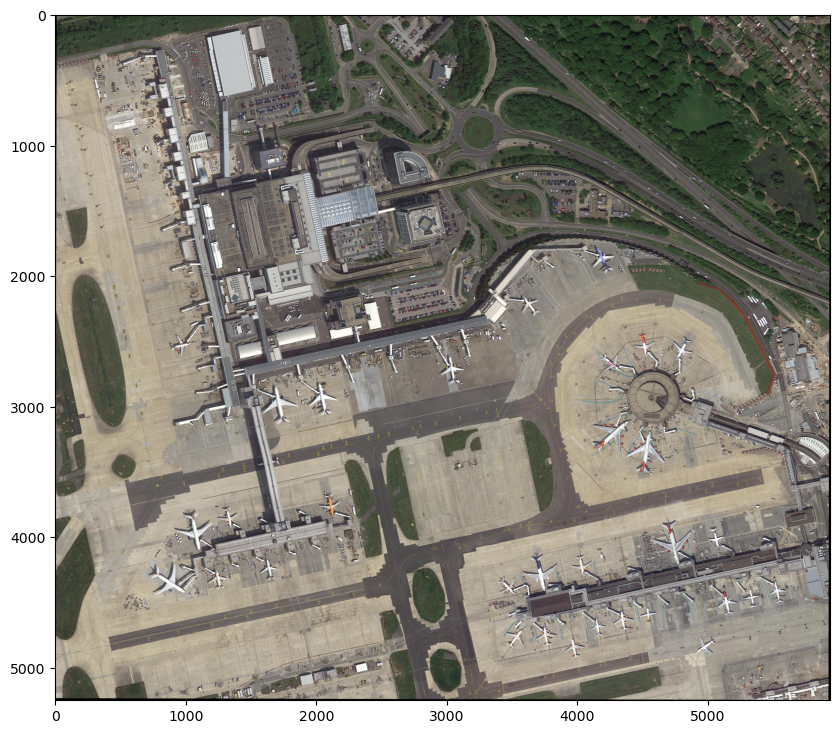

In [353]:
# set image
image_path = data[index]['image'][0]
local_image_path = '/home/datadisk/evaluation/data/Benchmark/datasets/'+image_path

image = cv2.imread(local_image_path)
image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

sam_predictor.set_image(image_source)
H, W, _ = image_source.shape

plt.figure(figsize=(10, 10))
plt.imshow(image_source)
plt.show()

PIPE: unknow error: need to fix


Text(0.5, 1.0, 'GT')

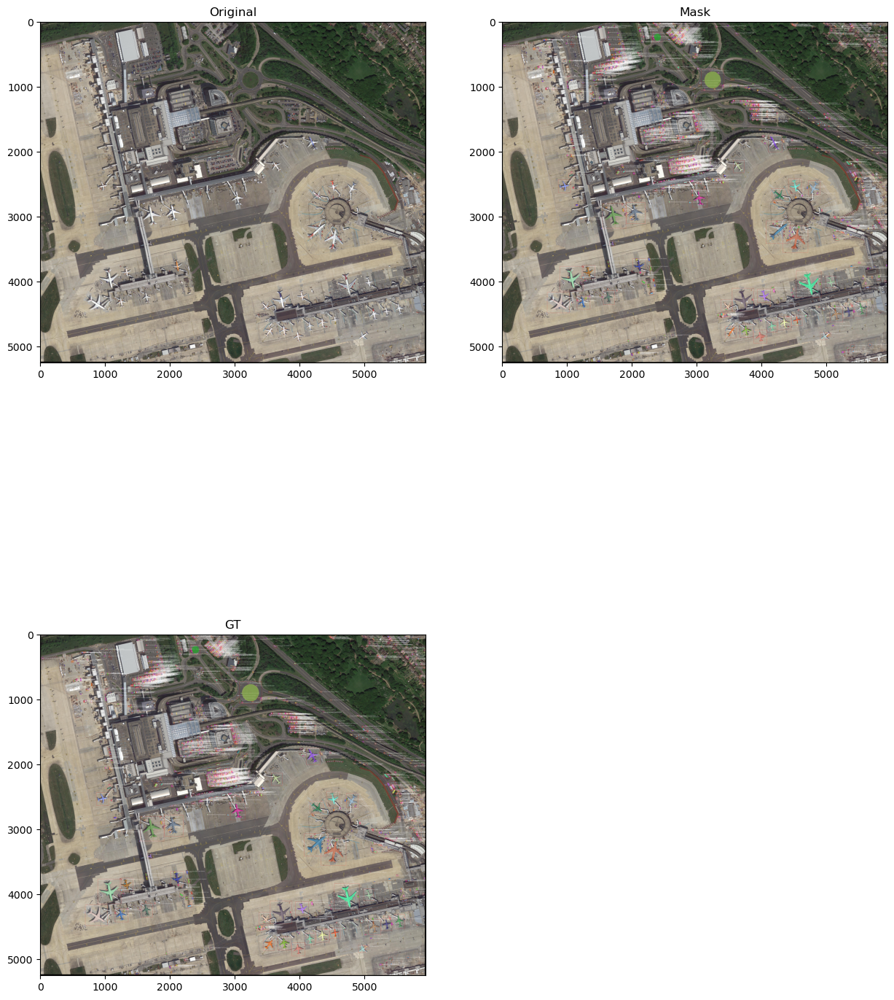

In [354]:
# x_point = 2064.0
# y_point = 3654.0
# w_point = 21.0
# h_point = 30.0




# roi_list = [
#     (1947.0, 2820.0, 224.0, 257.0),  # Example ROI 1
#     (2064.0, 3654.0, 21.0, 30.0),   # Example ROI 2
#     (3110.0, 775.0, 264.0, 260.0)
#     # Add more ROIs as needed
# ]

roi_list = box_list

H, W, _ = image_source.shape
main_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gt_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

dice_list = []
# Iterate over the ROI list and crop the image
for indexing, (x, y, w, h) in enumerate((roi_list)):
    
    isError = False
    expanded = int(w*0.15)
    
    #GT polygon to mask
    polygon = segmentation_poly[indexing]
    image_height = H  # Replace with actual image height
    image_width = W   # Replace with actual image width

    binary_mask = polygon_to_mask(polygon, image_height, image_width)
    
    # Crop the image using numpy slicing
    cropped_image = image_source[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]
    cropped_gt = binary_mask[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]
    
    try:
        sam_predictor.set_image(cropped_image)
    except:
        expanded = 0
        cropped_image = image_source[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]
        cropped_gt = binary_mask[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]
        sam_predictor.set_image(cropped_image)

    bbox = [expanded, expanded, w+expanded, h+expanded]
    
    input_point = np.array([[int(w/2)+expanded, int(h/2)+expanded]])
    input_label = np.array([1])
    
    input_box = np.array(bbox)
    
    
    
    masks, _, _ = sam_predictor.predict(
        point_coords=None,#input_point,
        point_labels=None,#input_label,
        box=input_box[None, :],
        multimask_output=False,
    )
    
    
    roi_mask = masks[0]
    
    
    
    #visualize overall
    over_y = int(y)-expanded
    over_x = int(x)-expanded
    over_w = int(w) + (expanded*2)
    over_h = int(h) + (expanded*2)
    
    
    random_color = np.random.randint(0, 255, (3,), dtype=np.uint8)
    alpha = 0.7
    
    try:
        for i in range(over_h):
            for j in range(over_w):
                if roi_mask[i, j]:
                    existing_pixel = main_image[over_y + i, over_x + j].astype(float)
                    blended_pixel = (1 - alpha) * existing_pixel + alpha * random_color
                    main_image[over_y + i, over_x + j] = np.clip(blended_pixel, 0, 255).astype(np.uint8)
    except:
        print ("PIPE: unknow error: need to fix")
    
    
    #calcualate dice

    cropped_gt = cropped_gt.squeeze(axis=-1)
    dice = dice_coefficient(roi_mask, cropped_gt)
    dice_list.append(dice)
    #GT mask visualization
    
    for i in range(H):
        for j in range(W):
            if binary_mask[i, j]:
                existing_pixel = gt_image[i, j].astype(float)
                blended_pixel = (1 - alpha) * existing_pixel + alpha * random_color
                gt_image[i, j] = np.clip(blended_pixel, 0, 255).astype(np.uint8)
                    
    #draw bbox
    cv2.rectangle(main_image, (over_x, over_y), (over_x + over_w, over_y + over_h), (255, 0, 0), 1)  # Red color, thickness=2
    #cv2.rectangle(gt_image, (over_x, over_y), (over_x + over_w, over_y + over_h), (255, 0, 0), 1)  # Red color, thickness=2
    
    # Add text to the bounding box
    text = label_list[indexing] +":"+ str(dice)
    font_scale = 0.5
    font_color = (255, 255, 255)  # White color for the text
    font_thickness = 1
    font = cv2.FONT_HERSHEY_SIMPLEX
    text_size, _ = cv2.getTextSize(text, font, font_scale, font_thickness)
    text_x = over_x + 5
    text_y = over_y + text_size[1] + 5

    cv2.putText(main_image, text, (text_x, text_y), font, font_scale, font_color, font_thickness)
    #cv2.putText(gt_image, text, (text_x, text_y), font, font_scale, font_color, font_thickness)
    
#     #patch visualiztion
#     print (label_list[indexing] +":"+ str(dice))
#     plt.imshow(roi_mask)
#     plt.show()
#     plt.imshow(cropped_gt)
#     plt.show()



# create figure 
fig = plt.figure(figsize=(15, 20)) 

rows = 2
columns = 2
 
# Adds a subplot at the 1st position 
fig.add_subplot(rows, columns, 1) 
plt.imshow(image_source)
plt.title("Original") 
  
# Adds a subplot at the 2nd position 
fig.add_subplot(rows, columns, 2) 
plt.imshow(main_image)
plt.title("Mask")

# Adds a subplot at the 2nd position 
fig.add_subplot(rows, columns, 3) 
plt.imshow(gt_image)
plt.title("GT")
    
#     h, w = masks.shape[-2:]
##visualization each patch
#     plt.figure(figsize=(10, 10))
#     plt.imshow(cropped_image)
#     show_mask(masks[0], plt.gca())
#     show_box(input_box, plt.gca())
#     plt.axis('off')
#     plt.show()

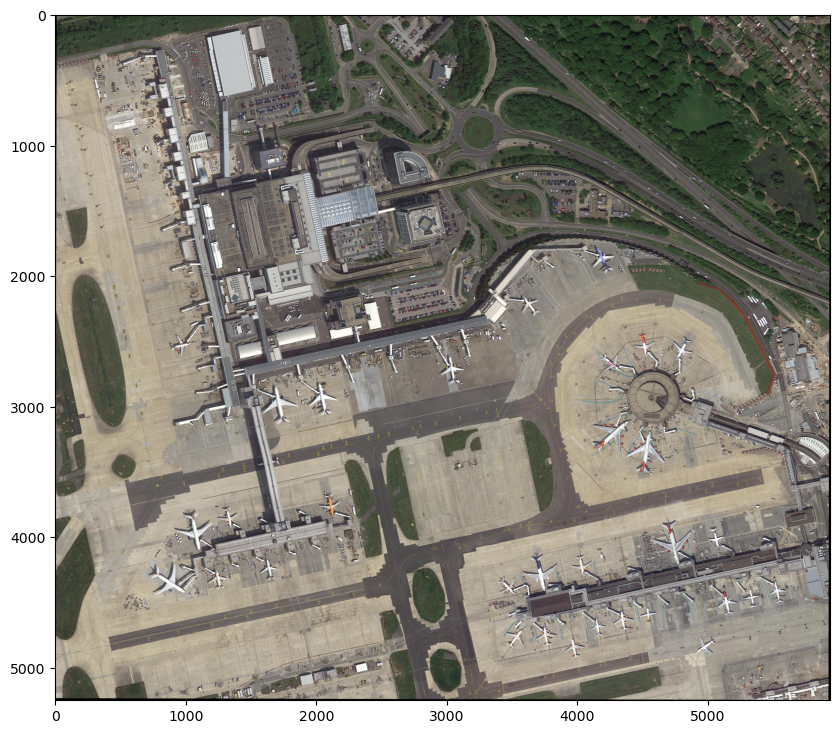

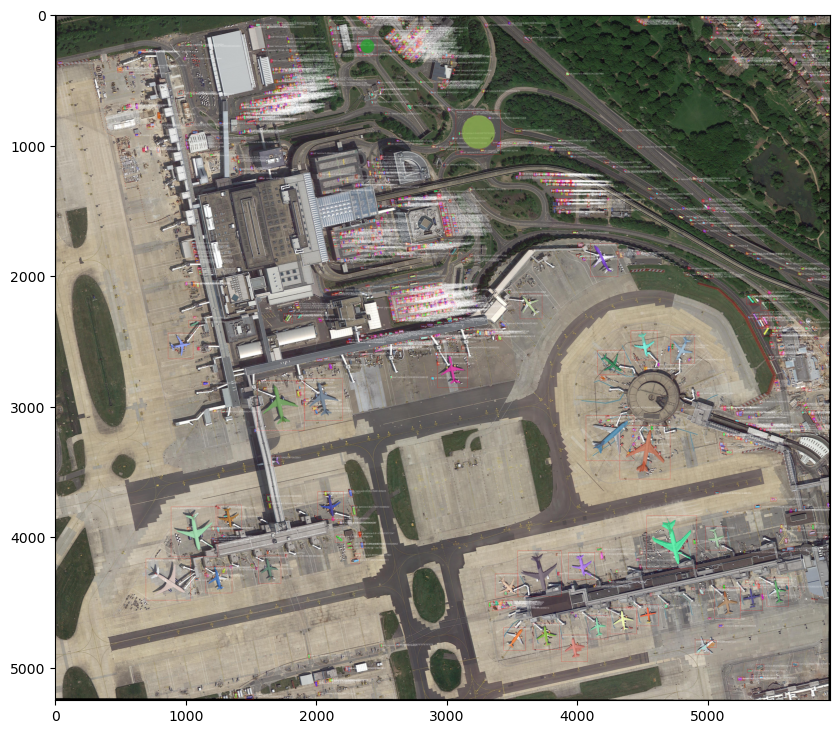

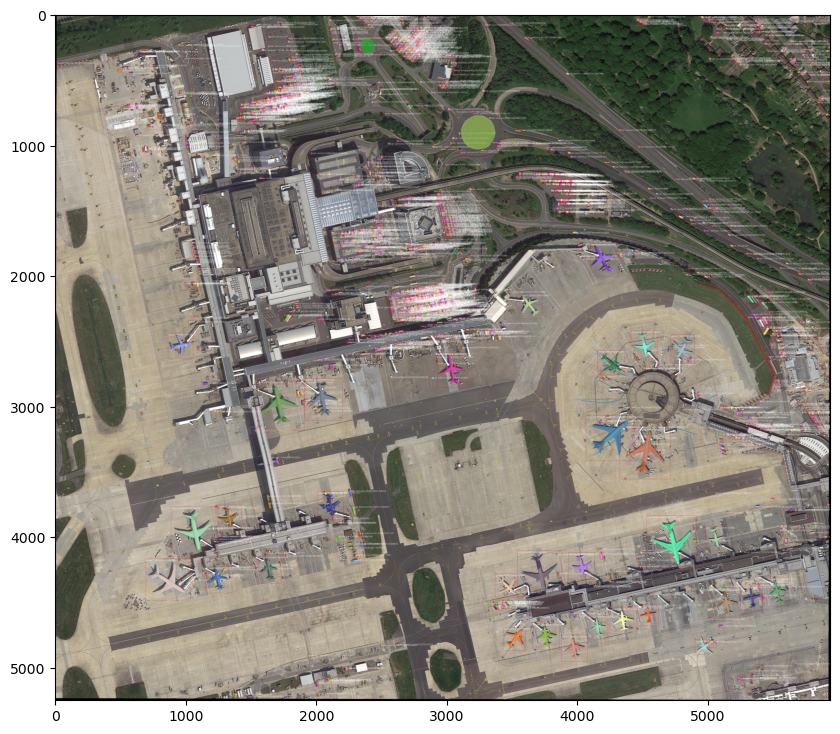

In [356]:

image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(image_source)
plt.show()
plt.figure(figsize=(10, 10))
plt.imshow(main_image)
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(gt_image)
plt.show()

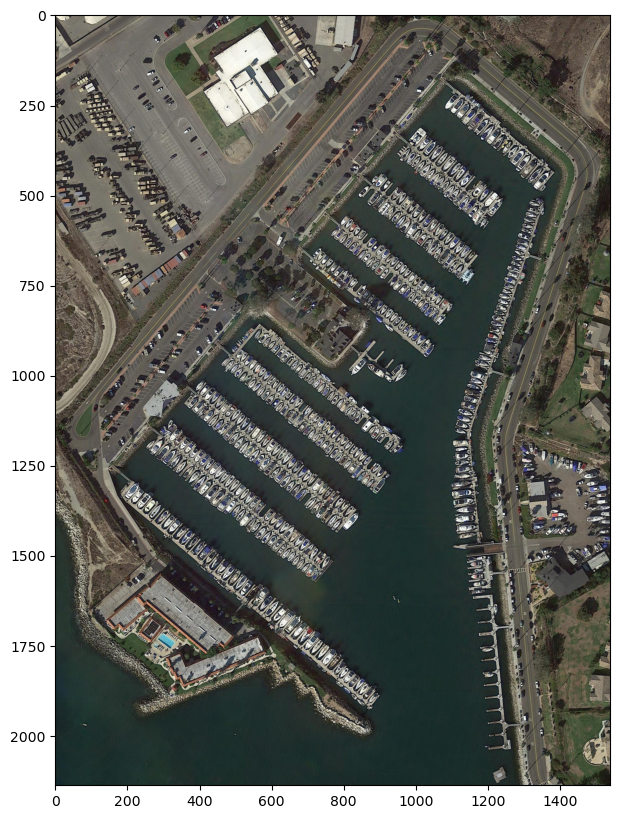

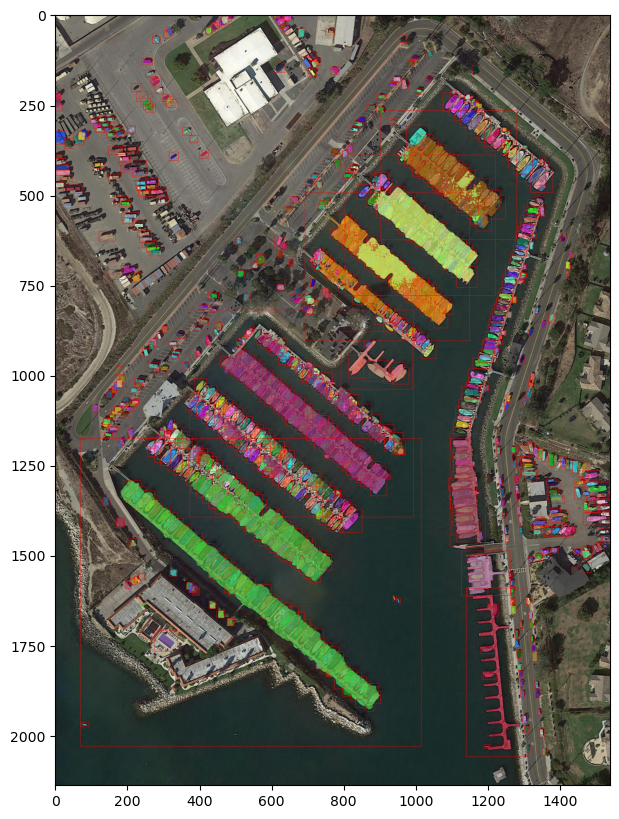

In [181]:
image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(image_source)
plt.show()
plt.figure(figsize=(10, 10))
plt.imshow(main_image)
plt.show()

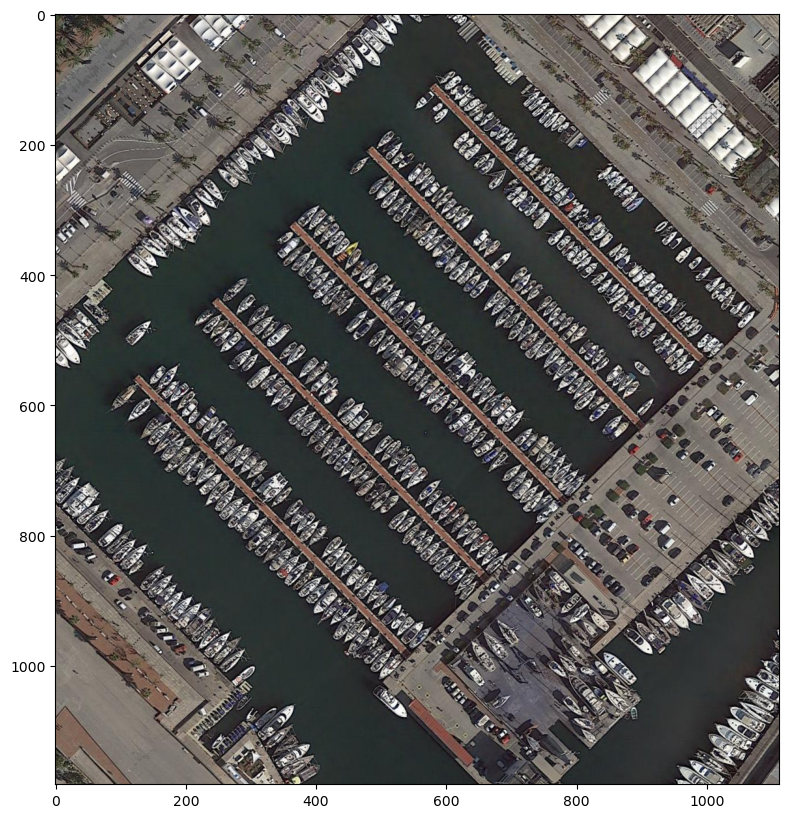

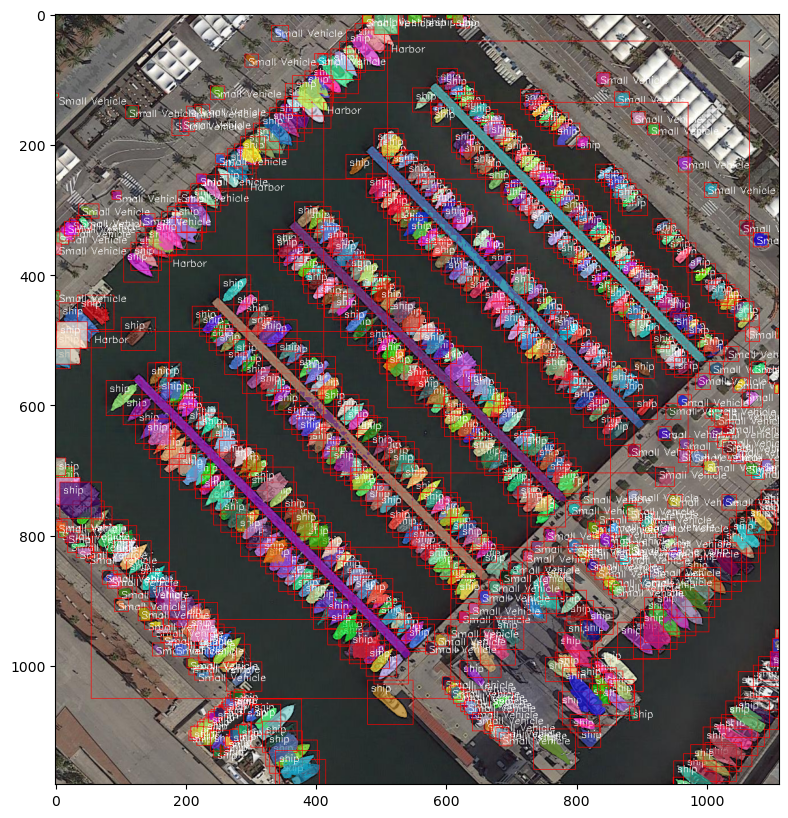

In [202]:
image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(image_source)
plt.show()
plt.figure(figsize=(10, 10))
plt.imshow(main_image)
plt.show()

Text(0.5, 1.0, 'Mask')

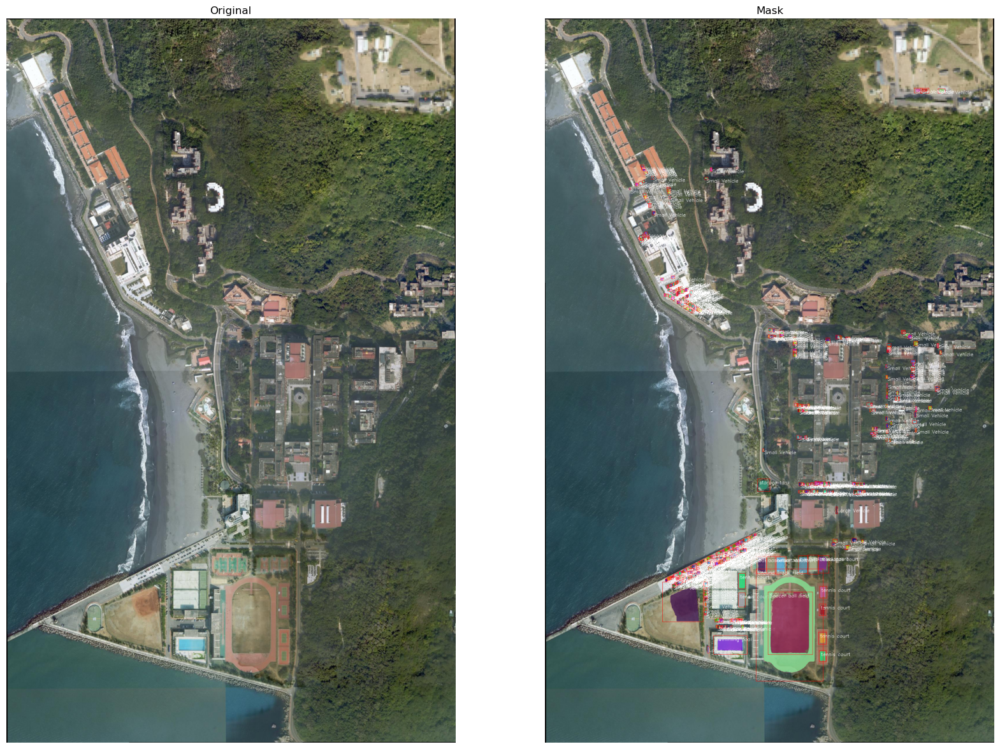

In [230]:
# create figure 
fig = plt.figure(figsize=(20, 20)) 
  
# setting values to rows and column variables 
rows = 1
columns = 2
  
image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  
# Adds a subplot at the 1st position 
fig.add_subplot(rows, columns, 1) 
  
# showing image 
plt.imshow(image_source)
plt.axis('off') 
plt.title("Original") 
  
# Adds a subplot at the 2nd position 
fig.add_subplot(rows, columns, 2) 
  
# showing image 
plt.imshow(main_image)
plt.axis('off') 
plt.title("Mask")

Text(0.5, 1.0, 'Mask')

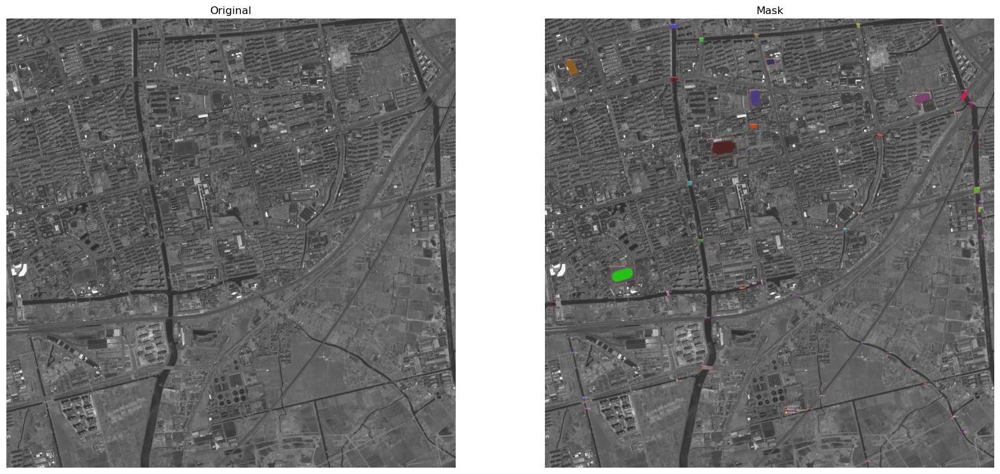

In [239]:
# create figure 
fig = plt.figure(figsize=(20, 20)) 
  
# setting values to rows and column variables 
rows = 1
columns = 2
  
image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  
# Adds a subplot at the 1st position 
fig.add_subplot(rows, columns, 1) 
  
# showing image 
plt.imshow(image_source)
plt.axis('off') 
plt.title("Original") 
  
# Adds a subplot at the 2nd position 
fig.add_subplot(rows, columns, 2) 
  
# showing image 
plt.imshow(main_image)
plt.axis('off') 
plt.title("Mask")

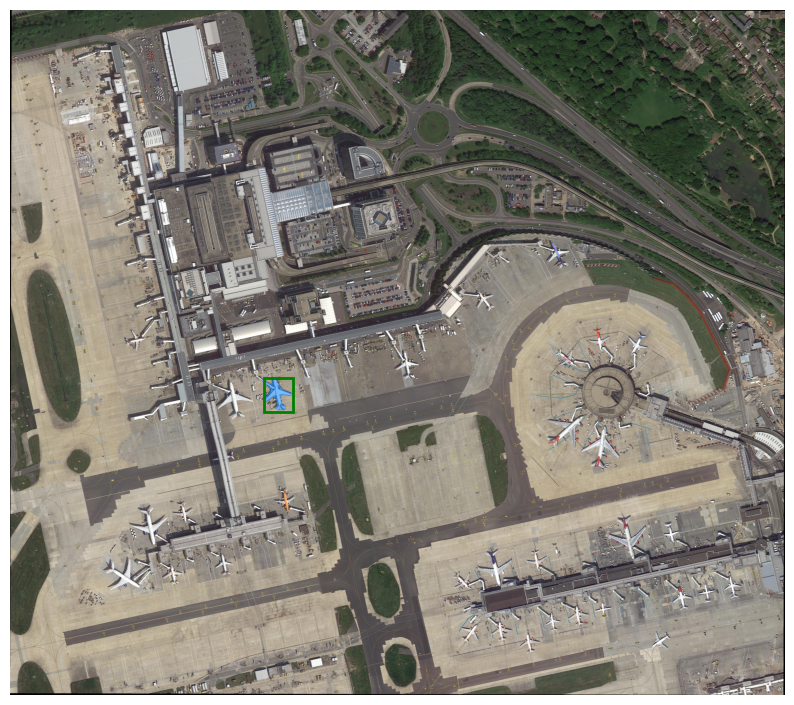

In [9]:

x_point = 1947.0
y_point = 2820.0
w_point = 224.0
h_point = 257.0



bbox = [x_point, y_point, x_point+w_point, y_point+h_point]

input_box = np.array(bbox)

masks, _, _ = sam_predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)


plt.figure(figsize=(10, 10))
plt.imshow(image_source)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.axis('off')
plt.show()